In [70]:
from gensim.models.doc2vec import Doc2Vec
from mofgraph2vec.featurize.mof2doc import MOF2doc
import numpy as np
from numpy.linalg import norm
import matplotlib.pyplot as plt
import matplotlib as mpl
from tqdm import tqdm
import scipy.stats as stats

mpl.rcParams['font.size'] = 15
import pandas as pd

In [2]:
doc = MOF2doc(
    cif_path = ["../data/cifs/rsm/"],
    wl_step = 2,
    n_components = 20,
    use_hash = False,
    writing_style = "paragraph",
    subsample = 1.0,
    seed = 1234,
)

In [3]:
documents = doc.get_documents()

  0%|          | 0/3254 [00:00<?, ?it/s]/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/lib/python3.8/site-packages/pymatgen/io/cif.py:1147: UserWarning: Issues encountered while parsing CIF: Some fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))
 28%|██▊       | 901/3254 [00:38<01:39, 23.61it/s]


KeyboardInterrupt: 

In [13]:
documents[0]

TaggedDocument(words=['Fe', 'Fe', 'Fe', 'Fe', 'Fe', 'Fe', 'Fe', 'Fe', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'Fe_O_O_O_O_O_O', 'Fe_O_O_O_O_O_O', 'Fe_O_O_O_O_O_O', 'Fe_O_O_O_O_O_O', 'Fe_O_O_O_O_O_O', 'Fe_O_O_O_O_O_O', 'Fe_O_O_O_O_O_O', 'Fe_O_O_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'P_O_O_O_O', 'H_O', 'H_O', 'H_O', 'H_O', 'H_O', 'H_O', 'H_O', 'H_O', 'H_O', 'H_O', 'H_O', 'H_O', 'C_C_O_O', 'C_C_O_O', 'C_C_O_O', 'C_C_O_O', 'C_C_O_O', 'C_C_O_O', 

In [3]:
doc.get_topovectors()

/Users/xiaoqi/opt/anaconda3/envs/mofdscribe/lib/python3.9/site-packages/pymatgen/io/cif.py:1165: UserWarning: Issues encountered while parsing CIF: Some fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))


[TaggedVector(vectors=array([4.01420379e+01, 9.41507118e+00, 5.26723755e+01, 4.69886837e-03,
        9.82390809e+00, 3.75417193e+01, 1.25681507e+00, 2.48995943e-02,
        4.80594419e+00, 3.71699958e+00, 3.31357662e+00, 6.19621516e-01,
        5.76609673e+00, 3.84832494e+01, 6.78713070e+00, 4.74150337e+01,
        1.60619025e+00, 1.55713151e+01, 2.13130521e+01, 7.73125769e+01,
        2.08237986e+01, 1.89460413e+00, 1.55155412e+00, 2.21559417e+01,
        5.98178915e+00, 2.39164843e+01, 2.42563681e-01, 1.79558971e+00,
        6.08265094e-02, 3.09601029e+01, 6.19161965e-04, 4.36681487e+01,
        4.43010941e+00, 1.01706680e+00, 9.51910907e-01, 2.69595333e+01,
        1.67656478e+01, 1.33826400e-01, 9.53385096e-01, 2.07436972e+01,
        2.14629904e+01, 4.21890419e+00, 8.64717981e-01, 4.18471701e+00,
        9.52078305e-02, 3.58580540e+00, 2.88667051e-01, 1.82922776e-01,
        1.59281710e+01, 4.58838452e+00]), tags=['RSM4343']),
 TaggedVector(vectors=array([1.23784454e+01, 3.9229343

In [ ]:
qmof_doc = MOF2doc(
    cif_path=["../data/cifs/qmof/"],
    subsample=None,
    wl_step=20
)
qmof_documents, _, _ = qmof_doc.get_documents()

In [4]:
def similarity(corpus, m, epochs):
    cos_dv = []
    cos_inf = []
    inferred_vec = []
    for i in tqdm(range(len(corpus))):
        v0 = m.dv[corpus[i].tags[0]]
        v1 = m.infer_vector(corpus[i].words, epochs=epochs)
        inferred_vec.append(v1)
        v2 = m.infer_vector(corpus[i].words, epochs=epochs)
        cos_a = np.dot(v0,v1)/(norm(v0)*norm(v1))
        cos_b = np.dot(v1,v2)/(norm(v1)*norm(v2))
        cos_dv.append(cos_a)
        cos_inf.append(cos_b)
    return cos_dv, cos_inf, inferred_vec

In [60]:
def histgram(target):
    density = stats.gaussian_kde(target)
    _, bins, _ = plt.hist(target, bins=np.linspace(-1, 1, 50), 
                   histtype=u'step', density=True)
    return bins, density(bins)

In [ ]:
m10 = Doc2Vec.load("../experiments/workflow/wandb/offline-run-20230224_094020-mlj02d5p/tmp/embedding_model.pt")
m20 = Doc2Vec.load("../experiments/workflow/wandb/offline-run-20230224_133159-zxi0306v/tmp/embedding_model.pt")
m30 = Doc2Vec.load("../experiments/workflow/wandb/offline-run-20230224_142150-i8qs87w8/tmp/embedding_model.pt")
m50 = Doc2Vec.load("../experiments/workflow/wandb/offline-run-20230224_152708-ej1zxzey/tmp/embedding_model.pt")
m100 = Doc2Vec.load("../experiments/workflow/wandb/offline-run-20230224_165408-iv06x09s/tmp/embedding_model.pt")


In [31]:
m10_cos_dv_10, m10_cos_inf_10, m10_vec_10 = similarity(documents, m10, 10)
m10_cos_dv_40, m10_cos_inf_40, m10_vec_40 = similarity(documents, m10, 40)

100%|██████████| 3257/3257 [03:12<00:00, 16.94it/s]


In [32]:
m30_cos_dv_10, m30_cos_inf_10, m30_vec_10 = similarity(documents, m30, 10)
m30_cos_dv_40, m30_cos_inf_40, m30_vec_40 = similarity(documents, m30, 40)

100%|██████████| 3257/3257 [03:06<00:00, 17.50it/s]


In [17]:
m50_cos_dv_10, m50_cos_inf_10, m50_vec_10 = similarity(documents, m50, 10)
m50_cos_dv_40, m50_cos_inf_40, m50_vec_40 = similarity(documents, m50, 40)

100%|██████████| 3257/3257 [12:18<00:00,  4.41it/s]


In [37]:
m100_cos_dv_10, m100_cos_inf_10, m100_vec_10 = similarity(documents, m100, 10)
m100_cos_dv_40, m100_cos_inf_40, m100_vec_40 = similarity(documents, m100, 40)

100%|██████████| 3257/3257 [12:26<00:00,  4.36it/s]


In [91]:
m100_cos_dv_80, m100_cos_inf_80, m100_vec_80 = similarity(documents, m100, 80)

100%|██████████| 3257/3257 [24:44<00:00,  2.19it/s]  


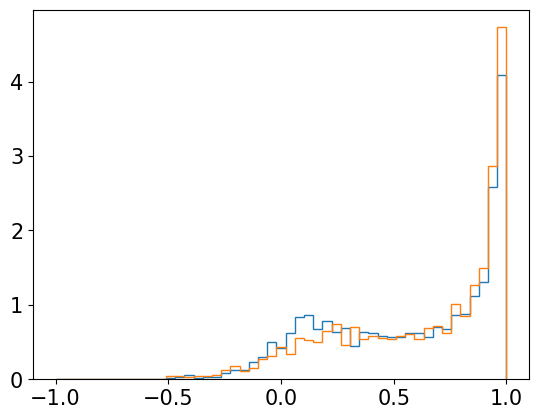

In [20]:
m10_e10_bin, m10_e10_hist = histgram(m10_cos_dv_10)
m10_e40_bin, m10_e40_hist = histgram(m10_cos_dv_40)

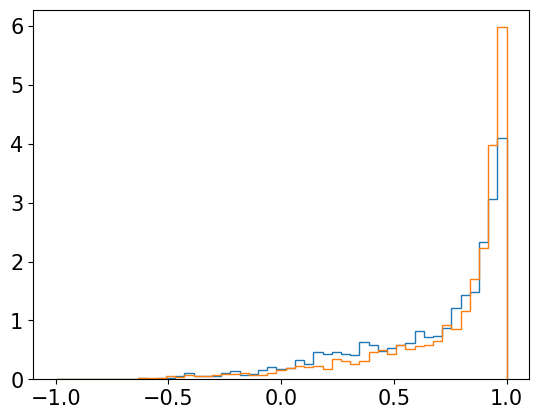

In [33]:
m30_e10_bin, m30_e10_hist = histgram(m30_cos_dv_10)
m30_e40_bin, m30_e40_hist = histgram(m30_cos_dv_40)

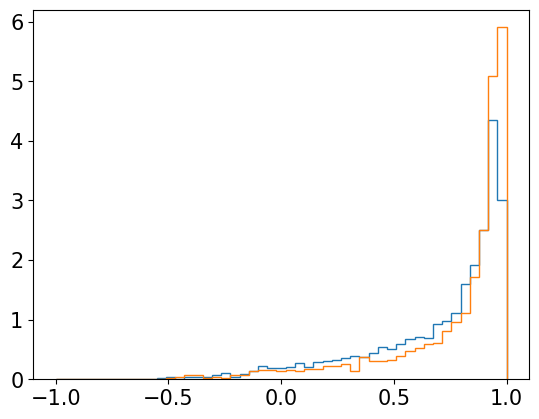

In [22]:
m50_e10_bin, m50_e10_hist = histgram(m50_cos_dv_10)
m50_e40_bin, m50_e40_hist = histgram(m50_cos_dv_40)

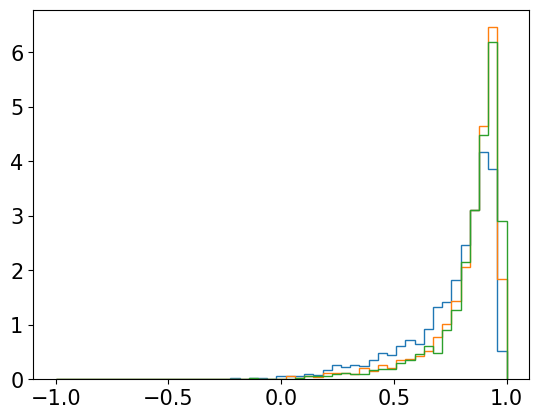

In [92]:
m100_e10_bin, m100_e10_hist = histgram(m100_cos_dv_10)
m100_e40_bin, m100_e40_hist = histgram(m100_cos_dv_40)
m100_e80_bin, m100_e80_hist = histgram(m100_cos_dv_80)

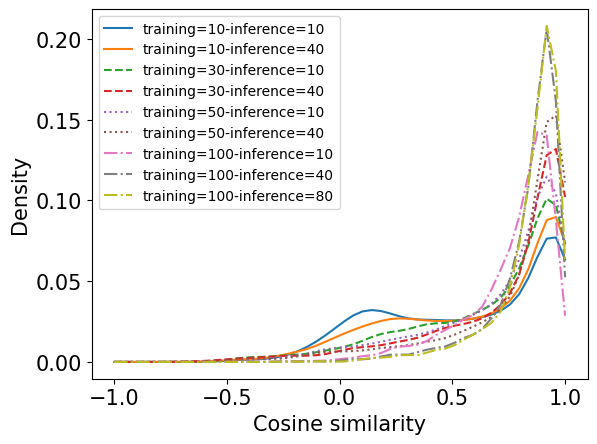

In [93]:
plt.plot(m10_e10_bin, (m10_e10_hist)/np.sum(m10_e10_hist), label="training=10-inference=10")
plt.plot(m10_e40_bin, (m10_e40_hist)/np.sum(m10_e40_hist), label="training=10-inference=40")  

plt.plot(m30_e10_bin, (m30_e10_hist)/np.sum(m30_e10_hist), linestyle='--', label="training=30-inference=10")
plt.plot(m30_e40_bin, (m30_e40_hist)/np.sum(m30_e40_hist), linestyle='--', label="training=30-inference=40") 

plt.plot(m50_e10_bin, (m50_e10_hist)/np.sum(m50_e10_hist), linestyle=':', label="training=50-inference=10")
plt.plot(m50_e40_bin, (m50_e40_hist)/np.sum(m50_e40_hist), linestyle=':', label="training=50-inference=40")  

plt.plot(m100_e10_bin, (m100_e10_hist)/np.sum(m100_e10_hist), linestyle='-.', label="training=100-inference=10")
plt.plot(m100_e40_bin, (m100_e40_hist)/np.sum(m100_e40_hist), linestyle='-.', label="training=100-inference=40") 
plt.plot(m100_e80_bin, (m100_e80_hist)/np.sum(m100_e80_hist), linestyle='-.', label="training=100-inference=80") 

plt.xlabel("Cosine similarity")
plt.ylabel("Density")
plt.legend(prop={'size': 10})

#plt.savefig("../plots/3-train_infer_epochs_4.png", dpi=1200)

In [44]:
def save_inference(vectors, wandb_path):
    out = []
    for i in tqdm(range(len(documents))):
        id = documents[i].tags[0]
        out.append([id] + list(vectors[i]))
    column_names = ["type"]+["x_"+str(dim) for dim in range(500)]
    out = pd.DataFrame(out, columns=column_names)
    out = out.sort_values(["type"])
    out.to_csv(wandb_path, index=None)

In [85]:
m10_vec_10

[array([ 1.3760641e-03,  1.0477428e-03, -4.9619214e-04, -1.5846152e-03,
         5.4503395e-04,  2.7506473e-04,  1.3684875e-03,  1.5106840e-03,
        -3.0981144e-04, -8.7939005e-04, -4.8468512e-04, -1.8021684e-04,
        -1.5329741e-03, -1.6148908e-03, -1.7687809e-04,  1.3434036e-03,
        -1.2533533e-03, -4.3349635e-04,  4.3087130e-05, -1.4306251e-03,
        -3.4807873e-04, -1.6418640e-03,  2.9747374e-04,  5.5744097e-04,
        -1.5096018e-03,  1.5980920e-03, -4.7011662e-04,  1.3551690e-03,
        -7.0389512e-04,  1.9172051e-03, -4.8311989e-04,  5.2009686e-04,
        -8.1534049e-04,  1.2458478e-03, -9.1007561e-04, -1.3301508e-03,
         2.7307696e-04,  5.6516257e-04,  1.2560560e-03,  1.4397973e-03,
        -6.4871961e-04,  1.5483930e-03, -1.0545094e-03,  1.3542159e-03,
         4.2847113e-04,  8.8455825e-04,  1.9833908e-04, -1.7841411e-04,
         2.8554400e-06,  6.2909159e-05,  1.4435628e-03,  1.0109203e-03,
        -2.7938627e-03, -1.6942449e-03, -5.9410447e-04, -1.57754

In [86]:
save_inference(m10_vec_10, "../experiments/workflow/wandb/offline-run-20230224_094020-mlj02d5p/tmp/embedding_e10.csv")
save_inference(m10_vec_40, "../experiments/workflow/wandb/offline-run-20230224_094020-mlj02d5p/tmp/embedding_e40.csv")

100%|██████████| 3257/3257 [00:00<00:00, 53296.28it/s]


In [88]:
save_inference(m30_vec_10, "../experiments/workflow/wandb/offline-run-20230224_142150-i8qs87w8/tmp/embedding_e10.csv")
save_inference(m30_vec_40, "../experiments/workflow/wandb/offline-run-20230224_142150-i8qs87w8/tmp/embedding_e40.csv")

100%|██████████| 3257/3257 [00:00<00:00, 53475.07it/s]


In [89]:
save_inference(m50_vec_10, "../experiments/workflow/wandb/offline-run-20230224_152708-ej1zxzey/tmp/embedding_e10.csv")
save_inference(m50_vec_40, "../experiments/workflow/wandb/offline-run-20230224_152708-ej1zxzey/tmp/embedding_e40.csv")

100%|██████████| 3257/3257 [00:00<00:00, 52973.25it/s]


In [90]:
save_inference(m100_vec_10, "../experiments/workflow/wandb/offline-run-20230224_165408-iv06x09s/tmp/embedding_e10.csv")
save_inference(m100_vec_40, "../experiments/workflow/wandb/offline-run-20230224_165408-iv06x09s/tmp/embedding_e40.csv")

100%|██████████| 3257/3257 [00:00<00:00, 45204.51it/s]


In [148]:
model = Doc2Vec.load("../experiments/workflow/wandb/offline-run-20230522_085105-cqmb8afg/tmp/embedding_model.pt")

In [149]:
model.wv.key_to_index

{'H_C': 0,
 'C_C_C_H': 1,
 'C_C_O_O': 2,
 'C_C_C_C': 3,
 'C_C_H_N': 4,
 'O_C': 5,
 'C_C_C_N': 6,
 'O_C_Zn': 7,
 'H_O': 8,
 'C_C_C_O': 9,
 'N_C_C_C': 10,
 'C_C_C_H_H': 11,
 'C_H_N_N': 12,
 'H_N': 13,
 'O_C_Cd': 14,
 'N_C_C_Zn': 15,
 'O_C_Cu': 16,
 'C_C_H_H_N': 17,
 'pure_methane_kH_4': 18,
 'C_C_H_H_H': 19,
 'pure_CO2_kH_0': 20,
 'pure_methane_kH_7': 21,
 'pure_methane_kH_1': 22,
 'pure_CO2_kH_3': 23,
 'pure_CO2_kH_8': 24,
 'pure_CO2_kH_6': 25,
 'pure_methane_kH_3': 26,
 'pure_methane_kH_0': 27,
 'pure_CO2_kH_9': 28,
 'pure_methane_kH_9': 29,
 'pure_CO2_kH_7': 30,
 'pure_CO2_kH_5': 31,
 'pure_CO2_kH_4': 32,
 'pure_CO2_kH_2': 33,
 'pure_methane_kH_2': 34,
 'pure_methane_kH_6': 35,
 'pure_methane_kH_8': 36,
 'pure_CO2_kH_1': 37,
 'pure_methane_kH_5': 38,
 'O_C_C': 39,
 'Zn_O_O_O_O': 40,
 'N_C_C': 41,
 'N_C_C_Cu': 42,
 'N_C_N': 43,
 'N_C_C_Cd': 44,
 'C_C_N_N': 45,
 'Cu_O_O_O_O': 46,
 'O_C_Cd_Cd': 47,
 'O_C_H': 48,
 'O_C_Mn': 49,
 'C_C_H_H_O': 50,
 'O_C_Co': 51,
 'C_C_N_O': 52,
 'N_C_C_H': 

In [150]:
model.wv.most_similar(positive=["pure_CO2_kH_9"])

[('pure_CO2_kH_8', 0.9883171916007996),
 ('K_O_O_O_O_O_S', 0.9859360456466675),
 ('O_Eu_Eu_Eu_H', 0.9858922362327576),
 ('N_C_C_Ce', 0.985751211643219),
 ('O_S_Sm', 0.9856789112091064),
 ('N_C_C_O', 0.9854777455329895),
 ('P_C_C_C_O', 0.9850894808769226),
 ('O_Ca_Ca_S', 0.9850398898124695),
 ('O_C_Ce_H', 0.9847179651260376),
 ('C_H_O_O', 0.9845812916755676)]

In [64]:
model.corpus_total_words

52883

In [68]:
model.dv.similar_by_word("RSM0001")

[('RSM2529', 0.4868178963661194),
 ('RSM2589', 0.4852721095085144),
 ('RSM4414', 0.4834930896759033),
 ('RSM4377', 0.48106417059898376),
 ('RSM4500', 0.4802781343460083),
 ('RSM4379', 0.47968360781669617),
 ('RSM1085', 0.47962117195129395),
 ('RSM2497', 0.47931891679763794),
 ('RSM2610', 0.4782062768936157),
 ('RSM4167', 0.4775831699371338)]

In [143]:
import os
from mofgraph2vec.data.spliter import quantile_binning
from collections import Counter

In [117]:
files = os.listdir("../data/meta/rsm_old")

In [119]:
data = [torch.load(os.path.join("../data/meta/rsm_old", fi)) for fi in files]

In [124]:
df = pd.read_csv("../data/data.csv").set_index("cif.label")

In [135]:
df["binned_pure_CO2_kH"] = quantile_binning(df.loc[:, "pure_CO2_kH"].values.reshape(-1,), np.arange(0, 1.1, 0.1))

In [126]:
names = [fi.rsplit(".pt")[0] for fi in files]

In [132]:
metal_list = [d.x[0][0] for d in data]

In [139]:
prop_list = [df.loc[n, "binned_pure_CO2_kH"] for n in names]

In [141]:
metal_prop_pair = [(m,p) for m, p in zip(metal_list, prop_list)]

In [144]:
Counter(metal_prop_pair)

Counter({('La', 6): 12,
         ('Zn', 4): 91,
         ('Zn', 7): 60,
         ('Cu', 2): 93,
         ('Mn', 9): 35,
         ('Co', 8): 14,
         ('Ba', 8): 6,
         ('Mn', 8): 39,
         ('Ag', 7): 6,
         ('Co', 3): 23,
         ('Cd', 8): 63,
         ('Gd', 9): 13,
         ('Tb', 9): 14,
         ('La', 4): 9,
         ('Cd', 7): 52,
         ('Zn', 1): 75,
         ('Cd', 9): 40,
         ('Cu', 3): 66,
         ('Cd', 3): 52,
         ('Mg', 8): 14,
         ('Ni', 7): 15,
         ('Lu', 4): 1,
         ('Ca', 9): 11,
         ('Ba', 2): 1,
         ('Cd', 6): 52,
         ('La', 7): 19,
         ('Co', 7): 21,
         ('Zn', 2): 86,
         ('Ba', 6): 2,
         ('Mg', 3): 9,
         ('Ca', 8): 14,
         ('Eu', 3): 3,
         ('Cu', 0): 102,
         ('Mn', 6): 24,
         ('Zn', 9): 32,
         ('Ni', 6): 17,
         ('V', 0): 2,
         ('Ni', 0): 19,
         ('Ag', 4): 19,
         ('Zn', 8): 48,
         ('Cu', 4): 43,
         ('Ba', 9): 11,
 